<a href="https://colab.research.google.com/github/JhulianaM/Mammography/blob/master/interpolacionx4SR1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import files
files.upload()  # Sube el archivo kaggle.json

!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets download -d kmader/mias-mammography
!unzip mias-mammography.zip -d mias

Saving kaggle.json to kaggle (1).json
Dataset URL: https://www.kaggle.com/datasets/kmader/mias-mammography
License(s): other
mias-mammography.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  mias-mammography.zip
replace mias/Info.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

Evaluando método de interpolación: Nearest


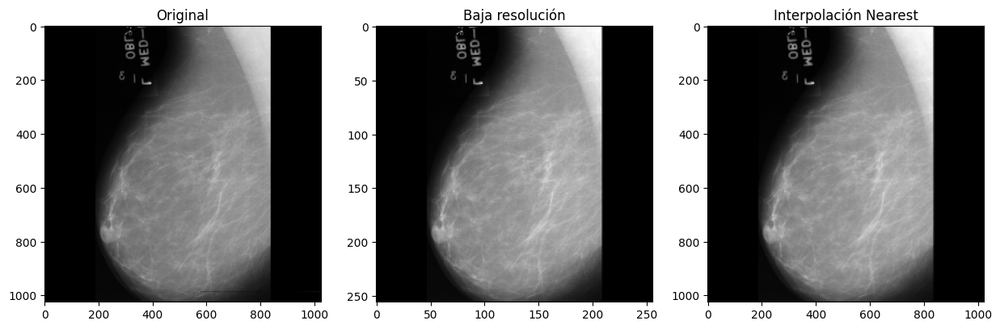

<ipython-input-4-cf1787c1ec86>:75: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr_value = compare_psnr(original_img, interpolated_img_gray)


Imagen 1 - PSNR: 9.68, SSIM: 0.3988


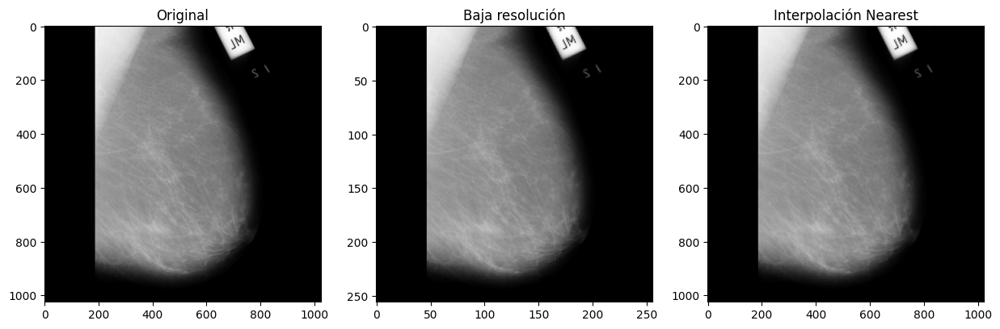

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


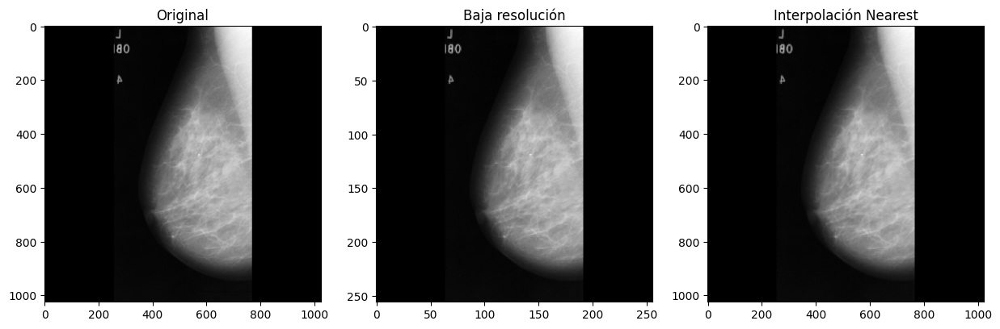

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


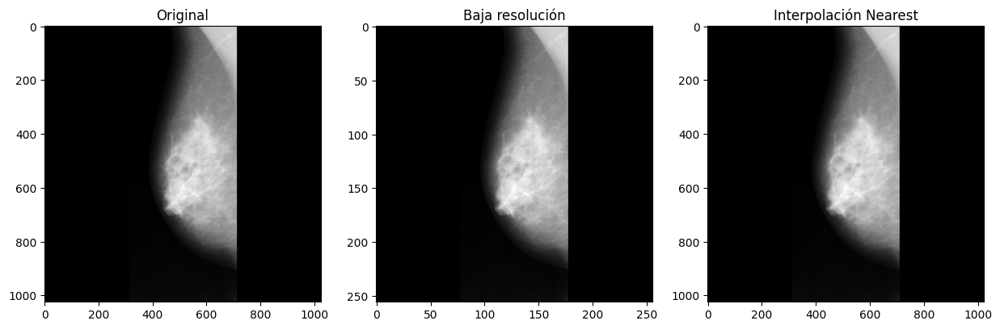

Imagen 4 - PSNR: 12.76, SSIM: 0.6960


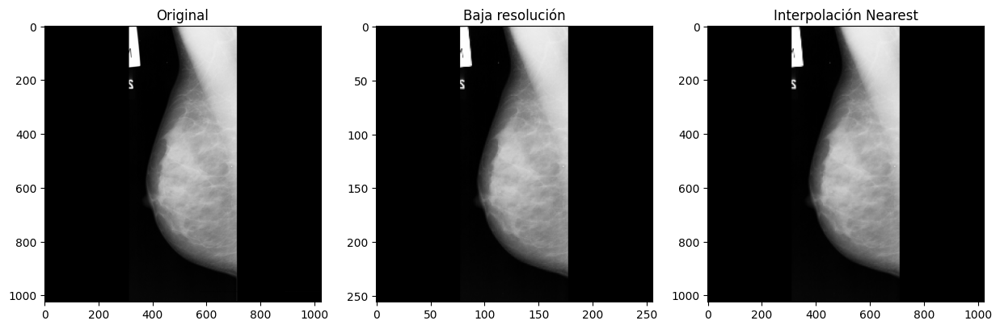

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Nearest: 10.63, SSIM promedio Nearest: 0.5600

Evaluando método de interpolación: Linear


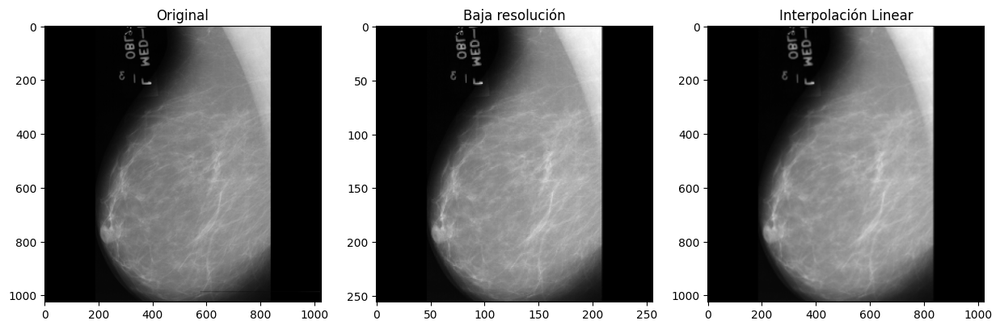

Imagen 1 - PSNR: 9.68, SSIM: 0.3988


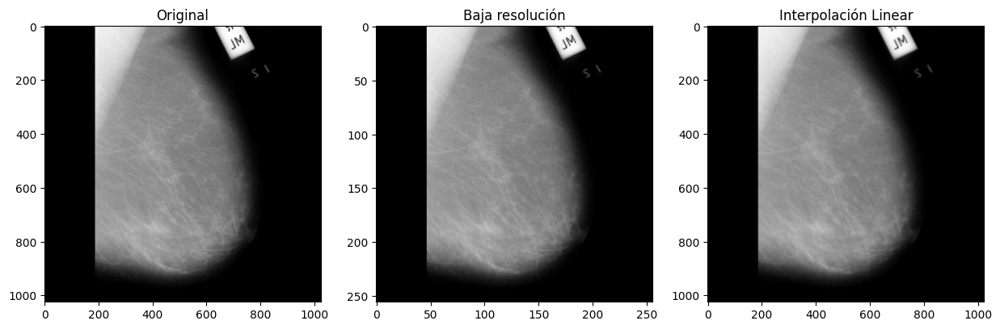

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


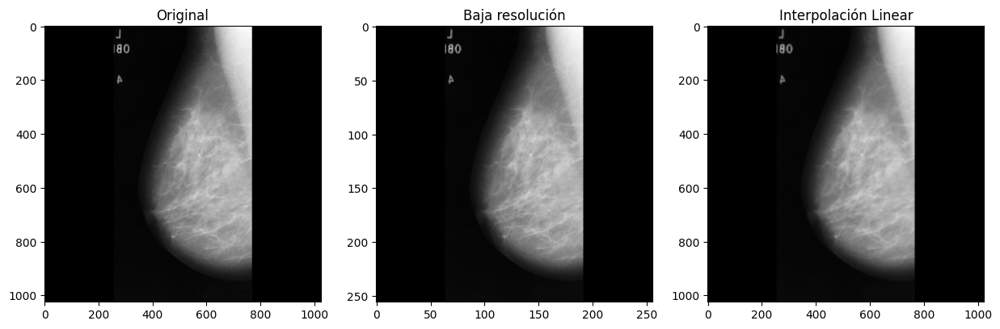

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


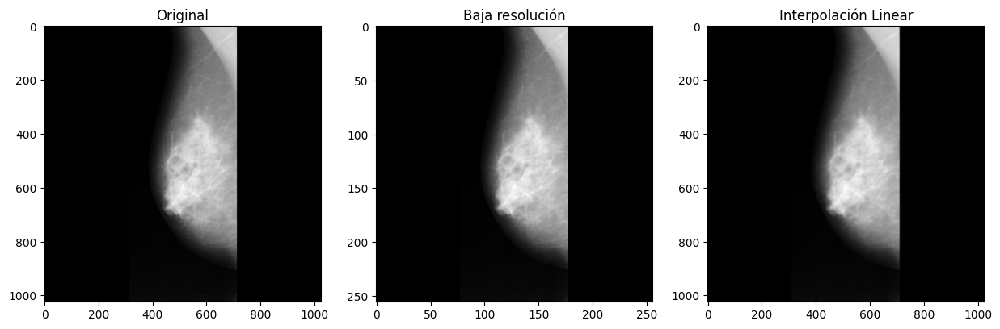

Imagen 4 - PSNR: 12.76, SSIM: 0.6960


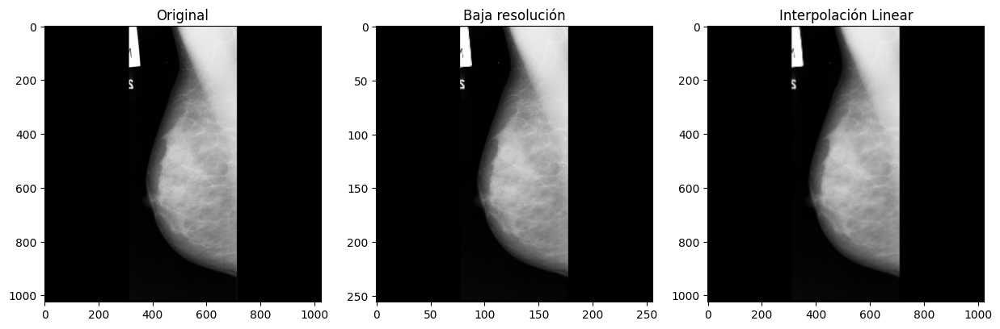

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Linear: 10.63, SSIM promedio Linear: 0.5600

Evaluando método de interpolación: Cubic


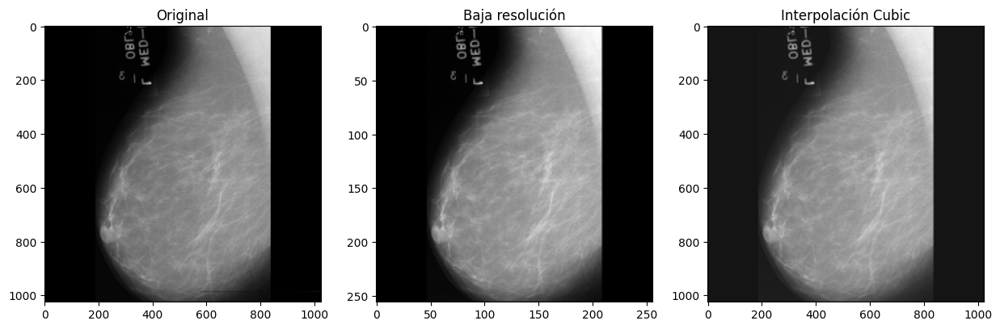

Imagen 1 - PSNR: 9.69, SSIM: 0.3988


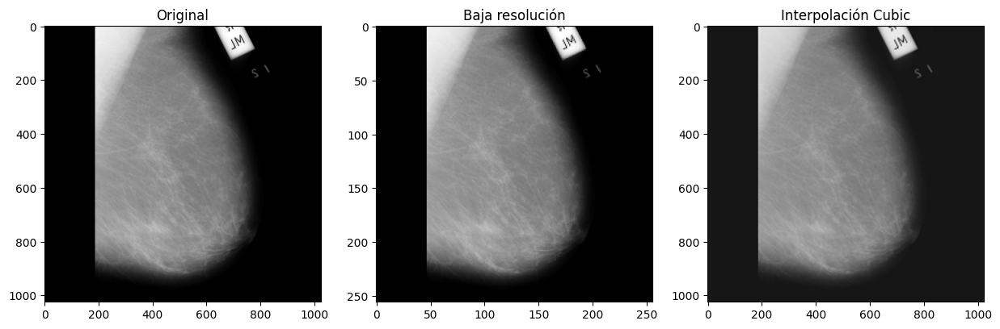

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


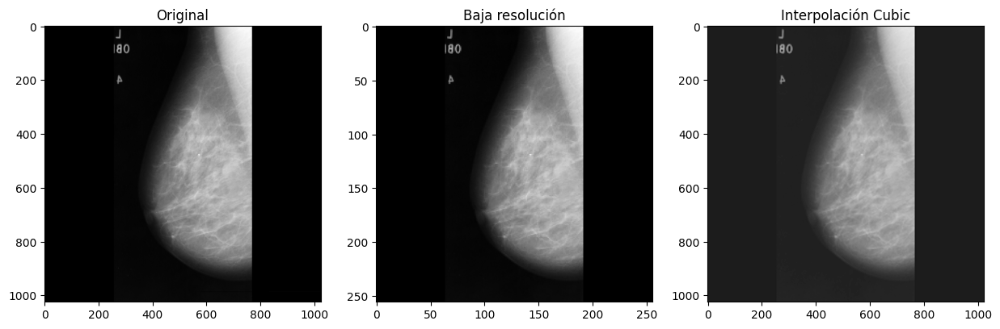

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


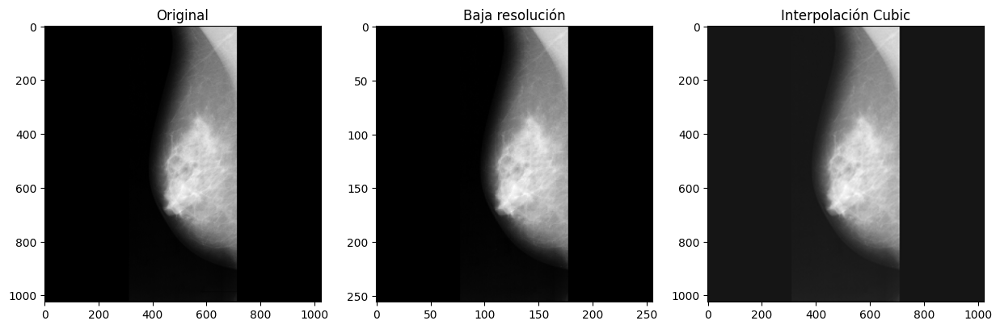

Imagen 4 - PSNR: 12.76, SSIM: 0.6960


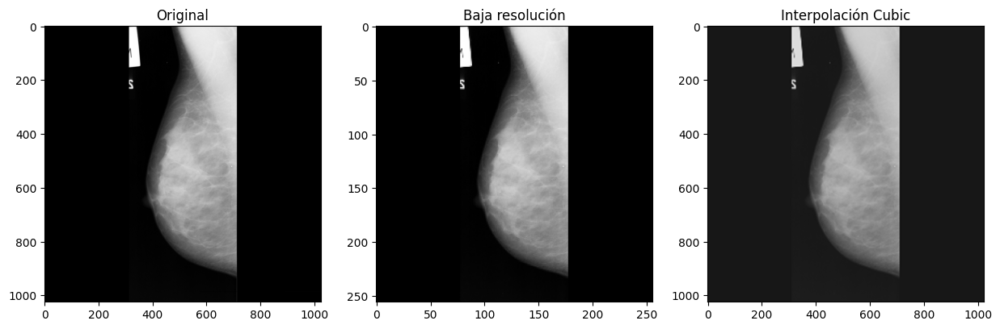

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Cubic: 10.63, SSIM promedio Cubic: 0.5600

Evaluando método de interpolación: Lanczos4


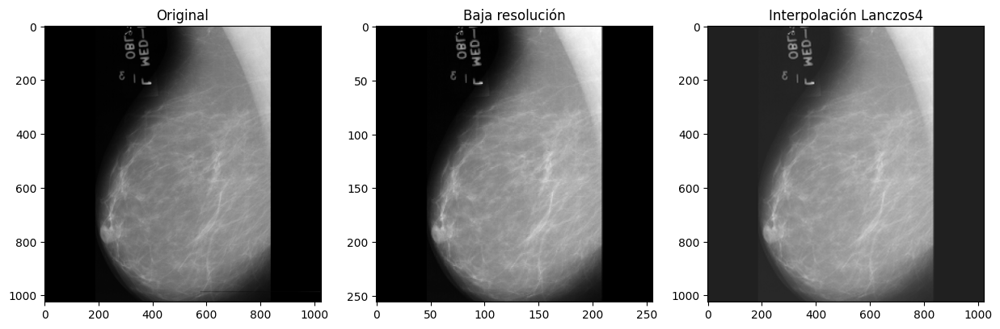

Imagen 1 - PSNR: 9.69, SSIM: 0.3988


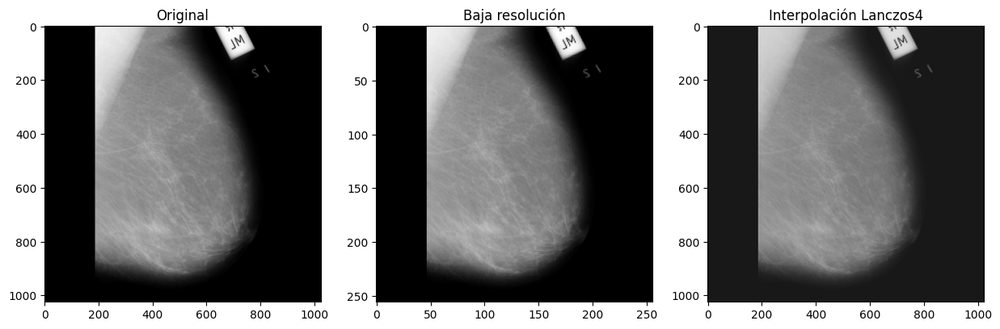

Imagen 2 - PSNR: 8.99, SSIM: 0.4839


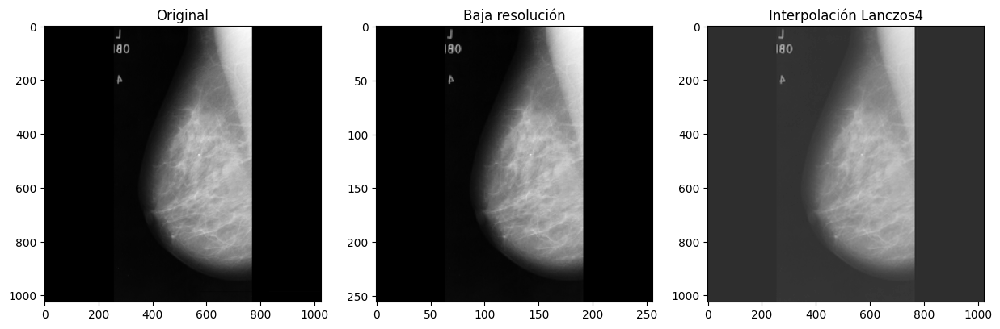

Imagen 3 - PSNR: 11.35, SSIM: 0.5354


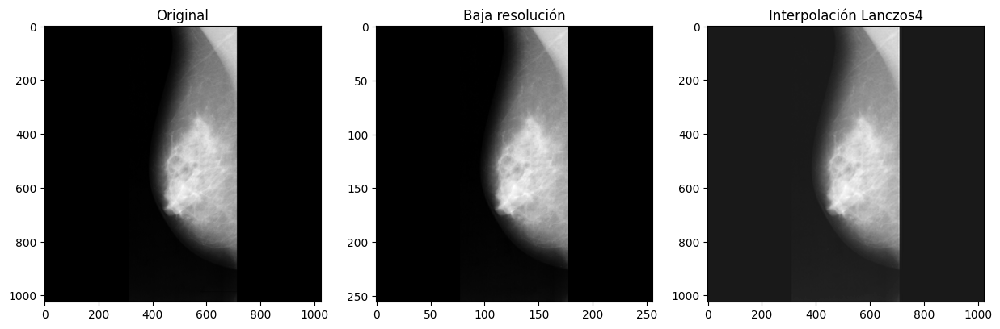

Imagen 4 - PSNR: 12.76, SSIM: 0.6960


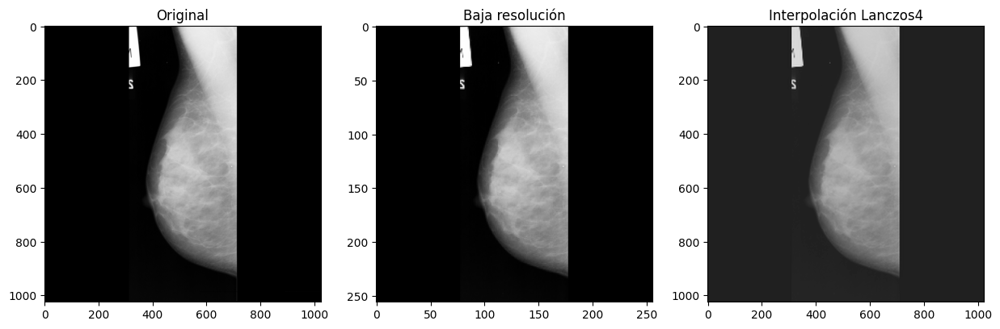

Imagen 5 - PSNR: 10.38, SSIM: 0.6861
PSNR promedio Lanczos4: 10.63, SSIM promedio Lanczos4: 0.5600



In [4]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim

# Directorio de imágenes
data_dir = "mias/all-mias/"

# Cargar imágenes
images = []
for file_name in os.listdir(data_dir):
    if file_name.endswith('.pgm'):
        img_path = os.path.join(data_dir, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        images.append(img)

# Normalización y preparación
images = np.array(images)
images = images.astype('float32') / 255.0

# Convertir imágenes en escala de grises a imágenes RGB
val_images = images[:10]
val_images_rgb = [np.stack((img,)*3, axis=-1) for img in val_images]

# Realizar la bajada de resolución
val_images_resized = [cv2.resize(img, (img.shape[1]//4, img.shape[0]//4)) for img in val_images_rgb]

# Añadir ruido gaussiano a las imágenes de baja resolución
#noise_std = 0.05
#val_images_noisy = [img + noise_std * np.random.randn(*img.shape) for img in val_images_resized]
#val_images_noisy = np.clip(val_images_noisy, 0, 1)  # Asegurarse de que los valores estén en el rango [0, 1]

# Convertir imágenes a uint8 para OpenCV
#val_images_noisy_uint8 = [np.uint8(img * 255) for img in val_images_resized]

# Métodos de interpolación en OpenCV
interpolation_methods = {
    "Nearest": cv2.INTER_NEAREST,
    "Linear": cv2.INTER_LINEAR,
    "Cubic": cv2.INTER_CUBIC,
    "Lanczos4": cv2.INTER_LANCZOS4
}

# Realizar la interpolación y la comparación
for method_name, method in interpolation_methods.items():
    print(f"Evaluando método de interpolación: {method_name}")

    psnr_values = []
    ssim_values = []

    interpolated_images = [cv2.resize(img, (img.shape[1]*4, img.shape[0]*4), interpolation=method) for img in val_images_resized]

    for i in range(5):
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Original')
        plt.imshow(val_images[i], cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Baja resolución')
        plt.imshow(cv2.cvtColor(val_images_resized[i], cv2.COLOR_BGR2GRAY), cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title(f'Interpolación {method_name}')
        plt.imshow(cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY), cmap='gray')
        plt.show()

        # Calcular PSNR y SSIM
        original_img = (val_images[i] * 255).astype(np.uint8)
        interpolated_img_gray = cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY)

        psnr_value = compare_psnr(original_img, interpolated_img_gray)
        ssim_value = compare_ssim(original_img, interpolated_img_gray)

        psnr_values.append(psnr_value)
        ssim_values.append(ssim_value)

        print(f'Imagen {i+1} - PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.4f}')

    # Mostrar los valores promedio de PSNR y SSIM
    average_psnr = np.mean(psnr_values)
    average_ssim = np.mean(ssim_values)
    print(f'PSNR promedio {method_name}: {average_psnr:.2f}, SSIM promedio {method_name}: {average_ssim:.4f}\n')

x4 con ruido 0.03



Evaluando método de interpolación: Nearest


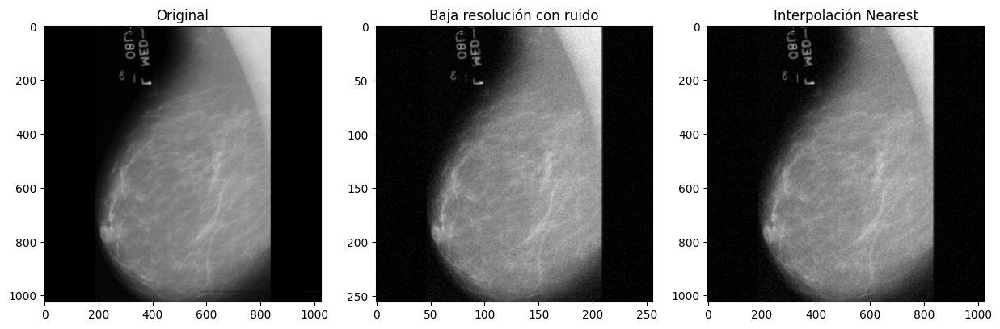

Imagen 1 - PSNR: 30.20, SSIM: 0.6368


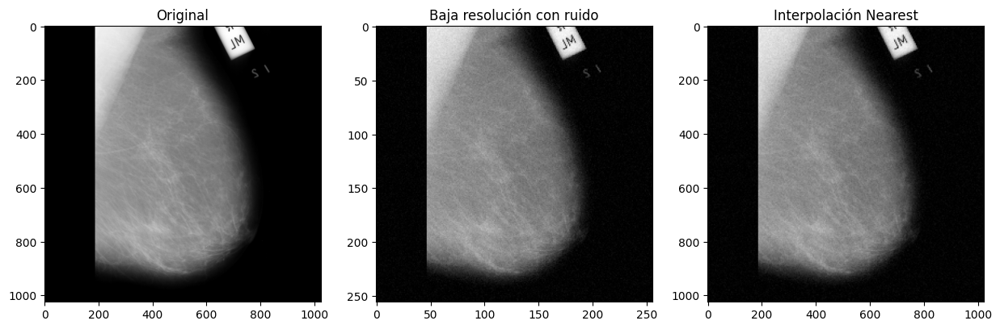

Imagen 2 - PSNR: 31.42, SSIM: 0.6126


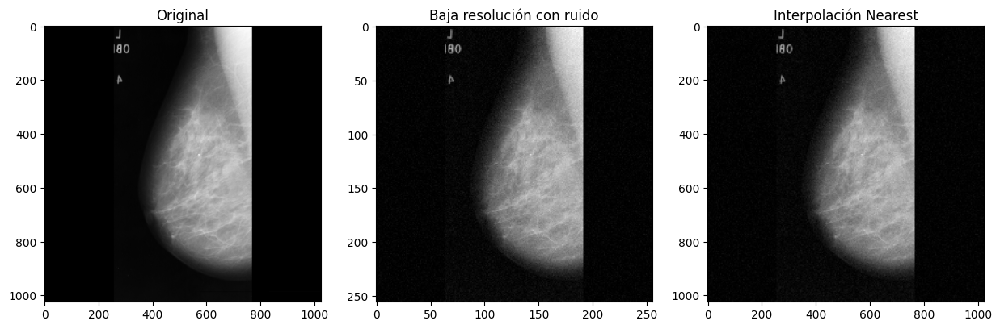

Imagen 3 - PSNR: 30.82, SSIM: 0.6155


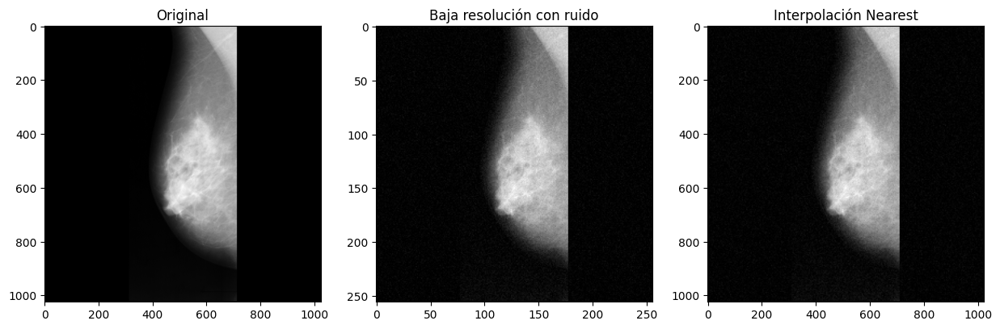

Imagen 4 - PSNR: 31.84, SSIM: 0.5671


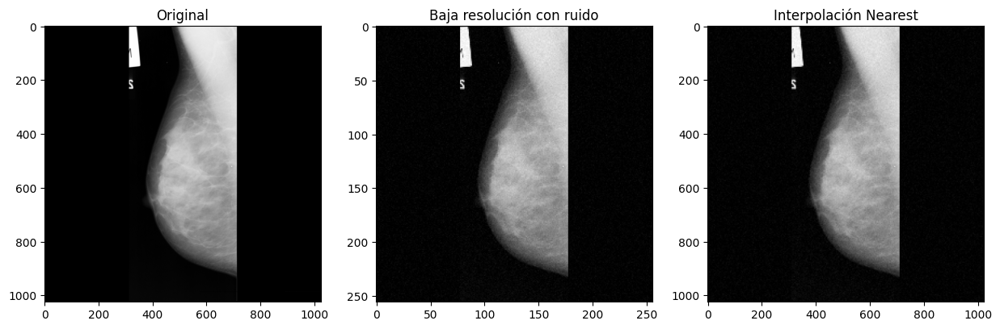

Imagen 5 - PSNR: 29.97, SSIM: 0.5739
PSNR promedio Nearest: 30.85, SSIM promedio Nearest: 0.6012

Evaluando método de interpolación: Linear


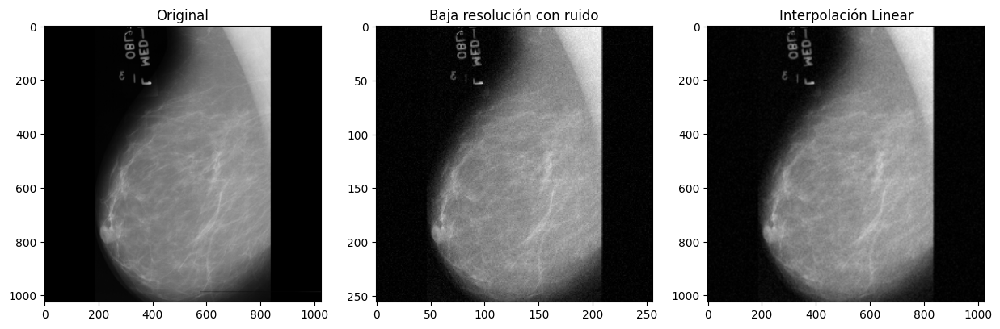

Imagen 1 - PSNR: 31.92, SSIM: 0.7230


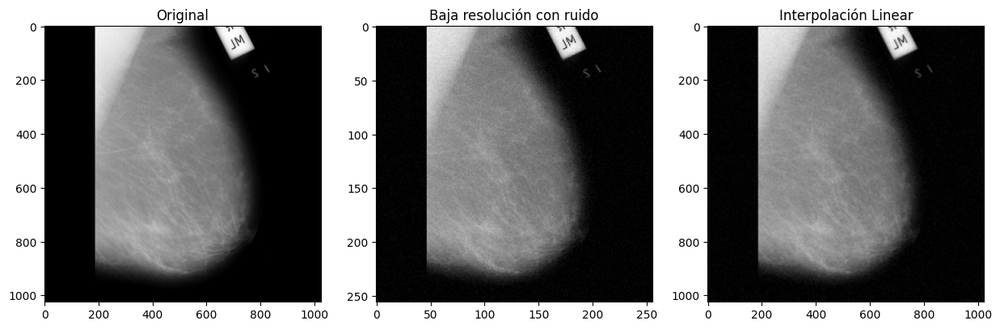

Imagen 2 - PSNR: 33.93, SSIM: 0.6893


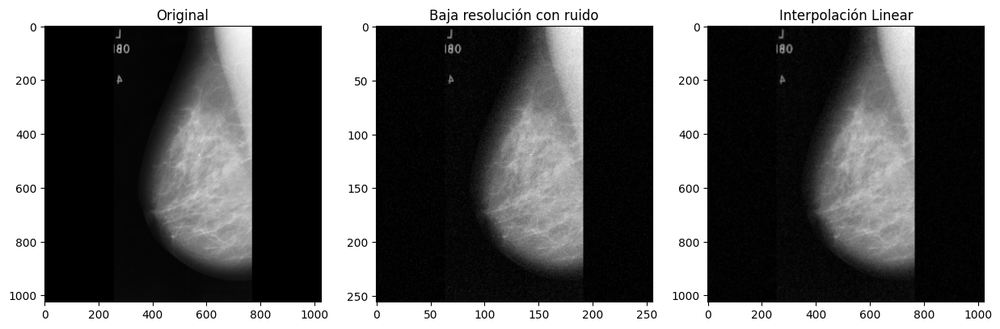

Imagen 3 - PSNR: 32.51, SSIM: 0.6864


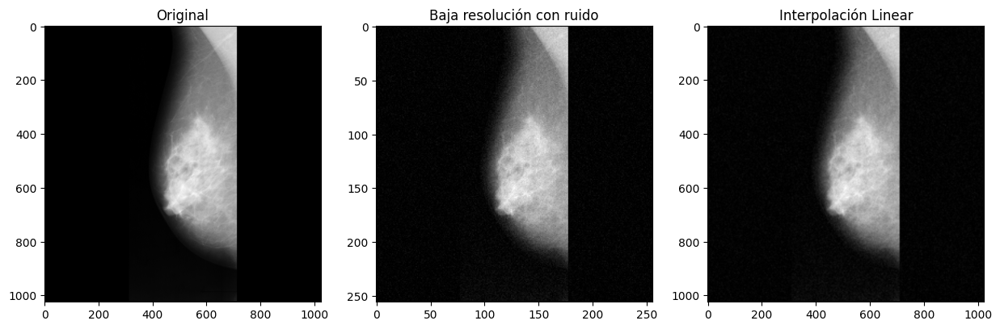

Imagen 4 - PSNR: 33.32, SSIM: 0.6230


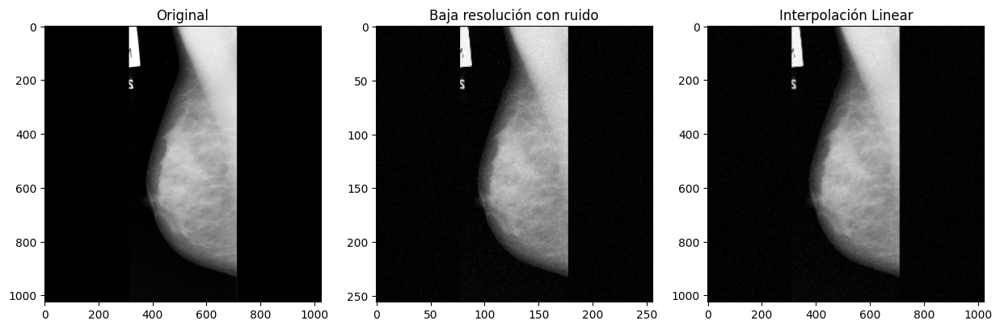

Imagen 5 - PSNR: 31.66, SSIM: 0.6296
PSNR promedio Linear: 32.67, SSIM promedio Linear: 0.6703

Evaluando método de interpolación: Cubic


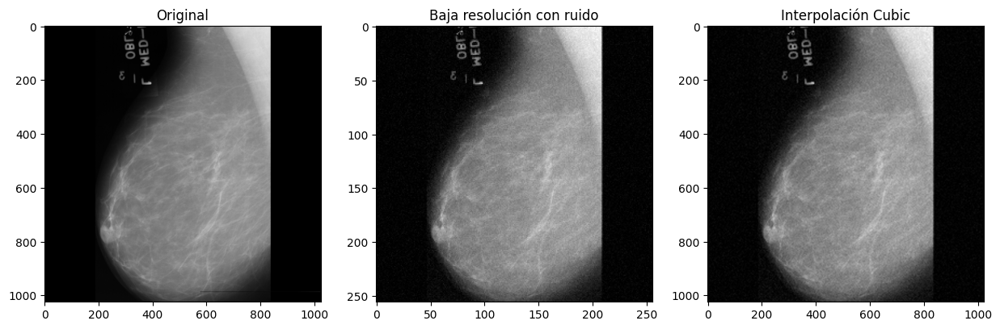

Imagen 1 - PSNR: 31.62, SSIM: 0.6799


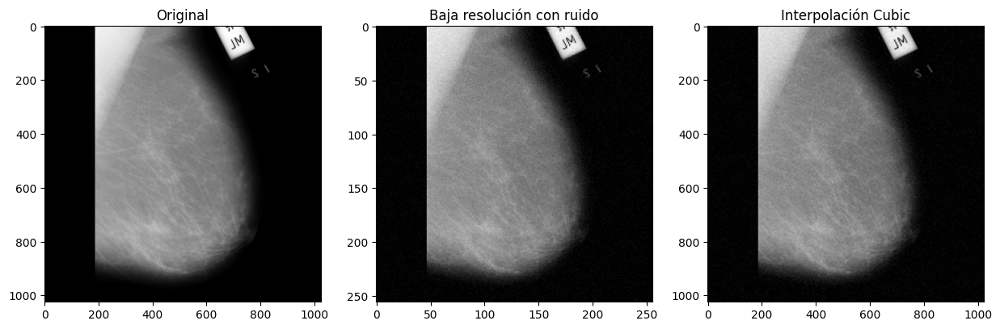

Imagen 2 - PSNR: 33.23, SSIM: 0.6470


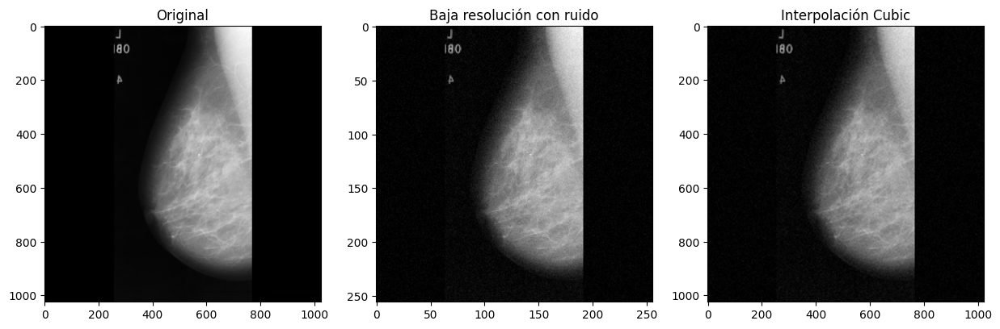

Imagen 3 - PSNR: 32.01, SSIM: 0.6456


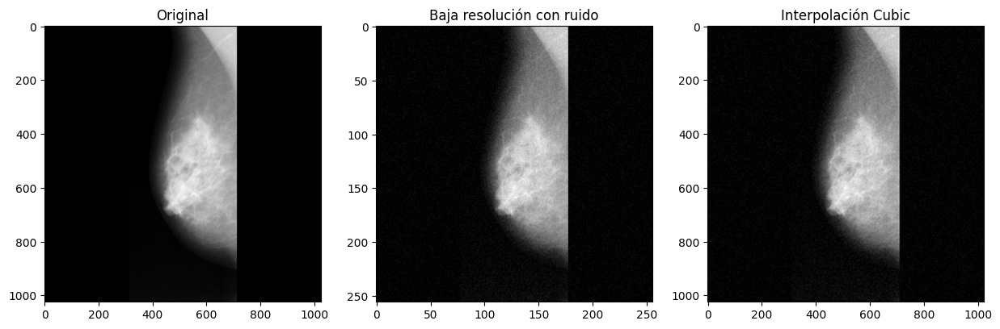

Imagen 4 - PSNR: 32.73, SSIM: 0.5844


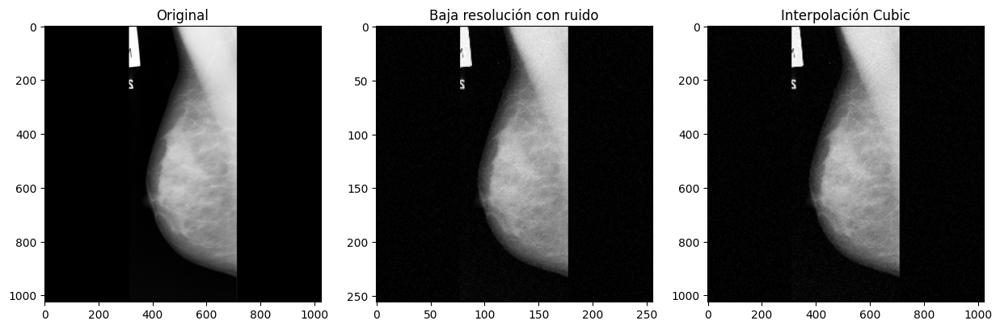

Imagen 5 - PSNR: 31.28, SSIM: 0.5919
PSNR promedio Cubic: 32.17, SSIM promedio Cubic: 0.6298

Evaluando método de interpolación: Lanczos4


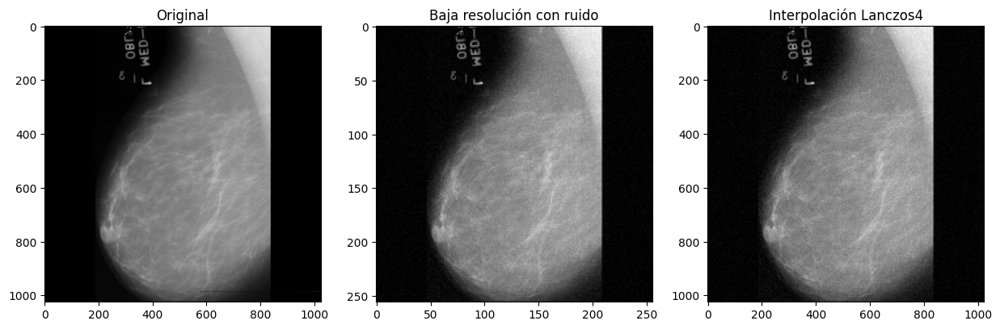

Imagen 1 - PSNR: 31.46, SSIM: 0.6606


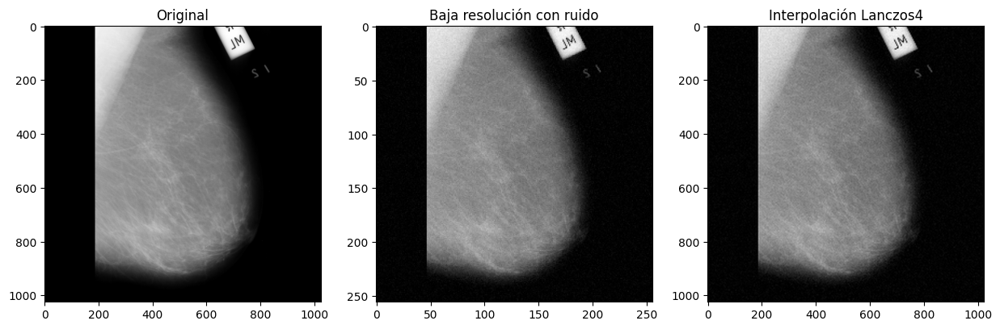

Imagen 2 - PSNR: 32.91, SSIM: 0.6251


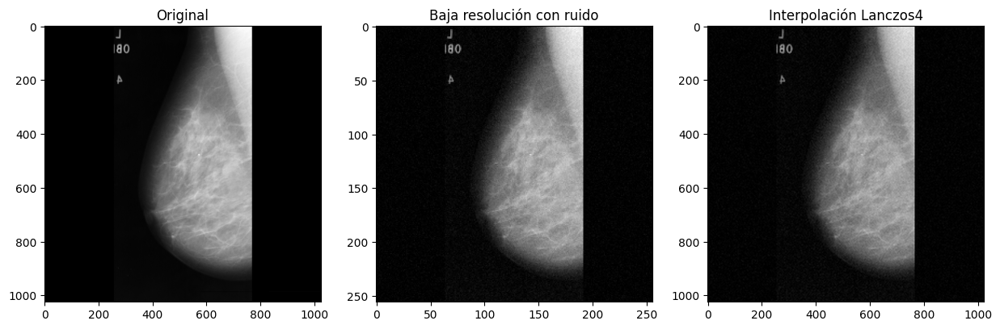

Imagen 3 - PSNR: 31.81, SSIM: 0.6253


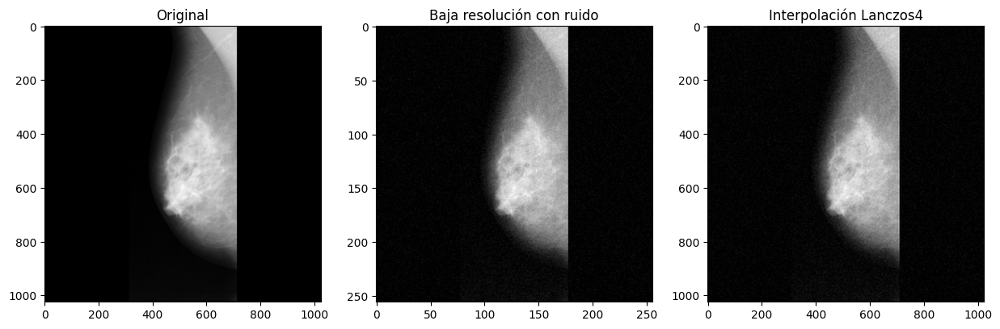

Imagen 4 - PSNR: 32.51, SSIM: 0.5644


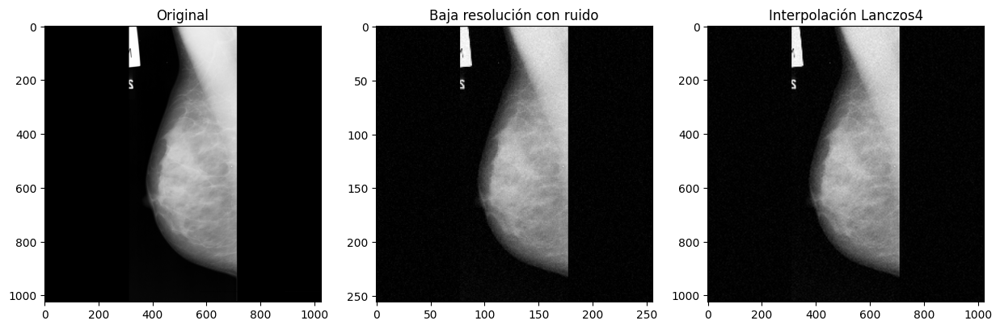

Imagen 5 - PSNR: 31.11, SSIM: 0.5702
PSNR promedio Lanczos4: 31.96, SSIM promedio Lanczos4: 0.6091



In [8]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim

# Directorio de imágenes
data_dir = "mias/all-mias/"

# Cargar imágenes
images = []
for file_name in os.listdir(data_dir):
    if file_name.endswith('.pgm'):
        img_path = os.path.join(data_dir, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        images.append(img)

# Normalización y preparación
images = np.array(images)
images = images.astype('float32') / 255.0

# Convertir imágenes en escala de grises a imágenes RGB
val_images = images[:10]
val_images_rgb = [np.stack((img,)*3, axis=-1) for img in val_images]

# Realizar la bajada de resolución
val_images_resized = [cv2.resize(img, (img.shape[1]//4, img.shape[0]//4)) for img in val_images_rgb]

# Añadir ruido gaussiano a las imágenes de baja resolución
noise_std = 0.03
val_images_noisy = [img + noise_std * np.random.randn(*img.shape) for img in val_images_resized]
val_images_noisy = np.clip(val_images_noisy, 0, 1)  # Asegurarse de que los valores estén en el rango [0, 1]

# Convertir imágenes a uint8 para OpenCV
val_images_noisy_uint8 = [np.uint8(img * 255) for img in val_images_noisy]

# Métodos de interpolación en OpenCV
interpolation_methods = {
    "Nearest": cv2.INTER_NEAREST,
    "Linear": cv2.INTER_LINEAR,
    "Cubic": cv2.INTER_CUBIC,
    "Lanczos4": cv2.INTER_LANCZOS4
}

# Realizar la interpolación y la comparación
for method_name, method in interpolation_methods.items():
    print(f"Evaluando método de interpolación: {method_name}")

    psnr_values = []
    ssim_values = []

    interpolated_images = [cv2.resize(img, (img.shape[1]*4, img.shape[0]*4), interpolation=method) for img in val_images_noisy_uint8]

    for i in range(5):
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Original')
        plt.imshow(val_images[i], cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Baja resolución con ruido')
        plt.imshow(cv2.cvtColor(val_images_noisy_uint8[i], cv2.COLOR_BGR2GRAY), cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title(f'Interpolación {method_name}')
        plt.imshow(cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY), cmap='gray')
        plt.show()

        # Calcular PSNR y SSIM
        original_img = (val_images[i] * 255).astype(np.uint8)
        interpolated_img_gray = cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY)

        psnr_value = compare_psnr(original_img, interpolated_img_gray)
        ssim_value = compare_ssim(original_img, interpolated_img_gray)

        psnr_values.append(psnr_value)
        ssim_values.append(ssim_value)

        print(f'Imagen {i+1} - PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.4f}')

    # Mostrar los valores promedio de PSNR y SSIM
    average_psnr = np.mean(psnr_values)
    average_ssim = np.mean(ssim_values)
    print(f'PSNR promedio {method_name}: {average_psnr:.2f}, SSIM promedio {method_name}: {average_ssim:.4f}\n')

In [ ]:
x4 ruido 0.05

Evaluando método de interpolación: Nearest


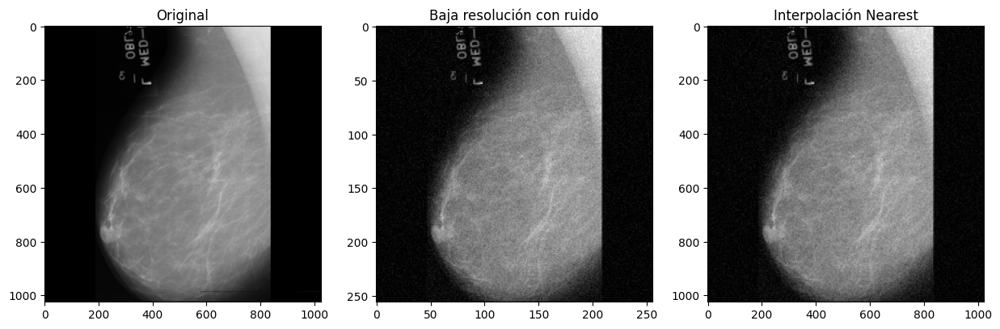

Imagen 1 - PSNR: 28.11, SSIM: 0.4518


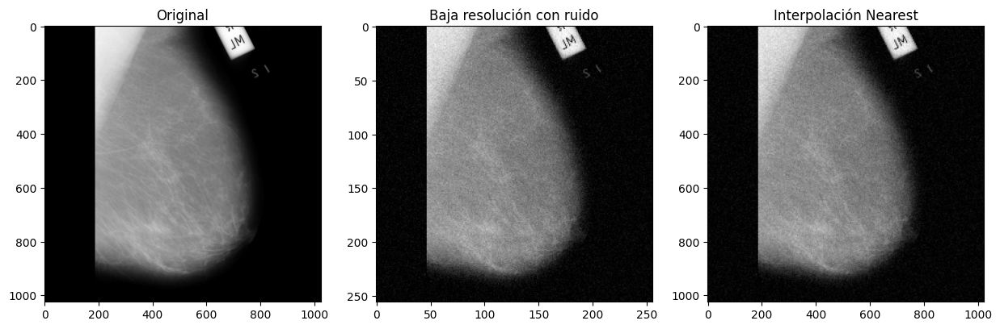

Imagen 2 - PSNR: 28.86, SSIM: 0.4194


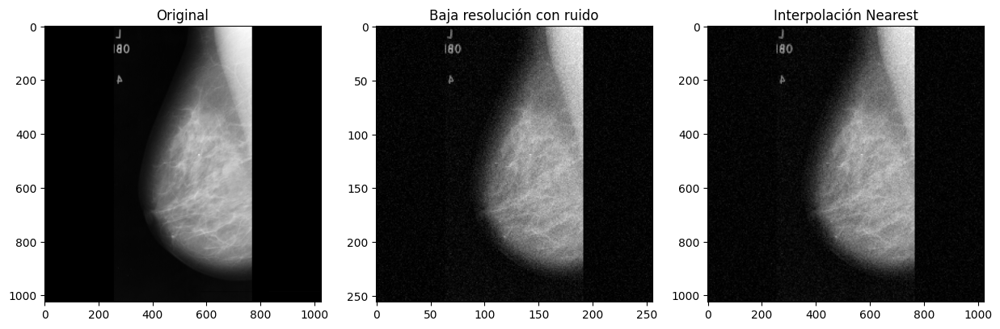

Imagen 3 - PSNR: 28.69, SSIM: 0.4264


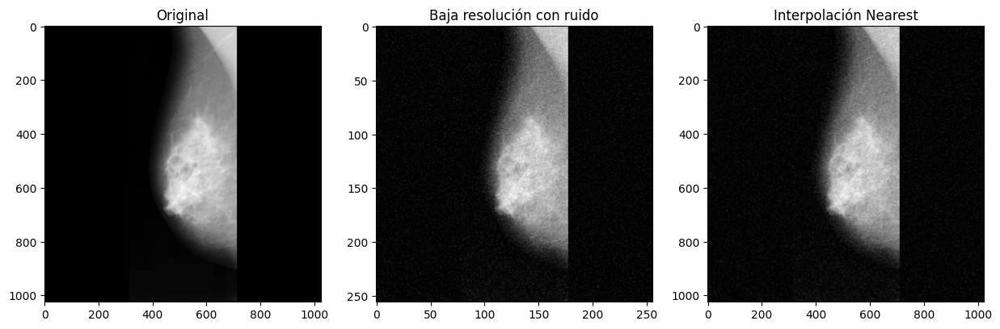

Imagen 4 - PSNR: 29.35, SSIM: 0.3660


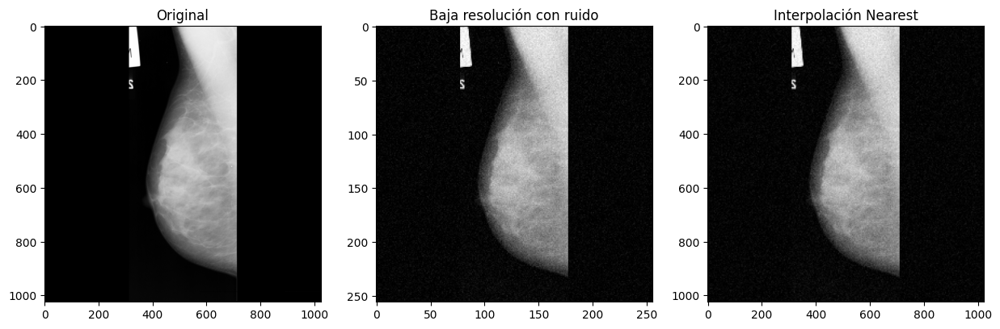

Imagen 5 - PSNR: 28.18, SSIM: 0.3737
PSNR promedio Nearest: 28.64, SSIM promedio Nearest: 0.4074

Evaluando método de interpolación: Linear


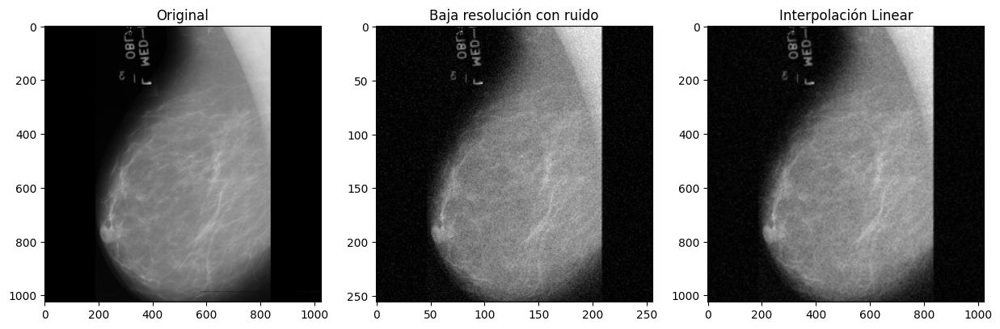

Imagen 1 - PSNR: 30.20, SSIM: 0.5759


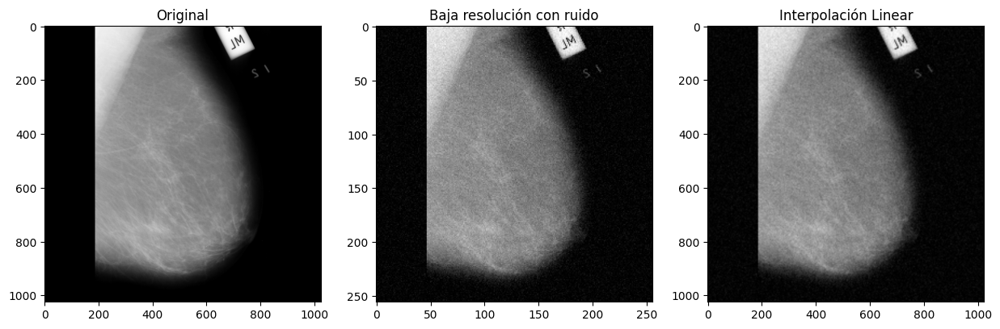

Imagen 2 - PSNR: 31.43, SSIM: 0.5273


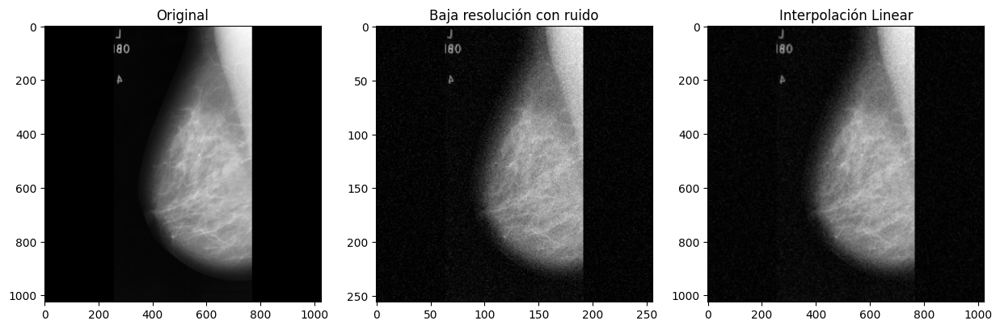

Imagen 3 - PSNR: 30.65, SSIM: 0.5235


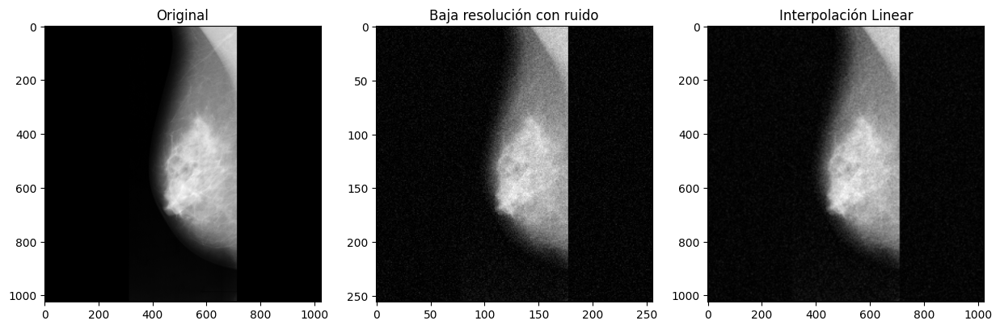

Imagen 4 - PSNR: 31.10, SSIM: 0.4368


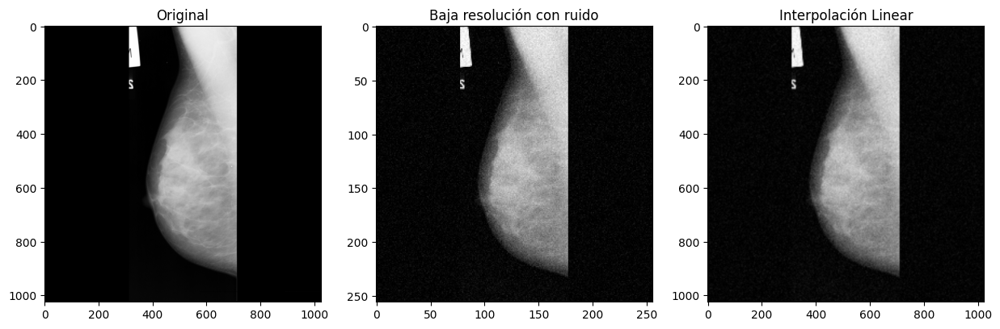

Imagen 5 - PSNR: 30.03, SSIM: 0.4459
PSNR promedio Linear: 30.68, SSIM promedio Linear: 0.5019

Evaluando método de interpolación: Cubic


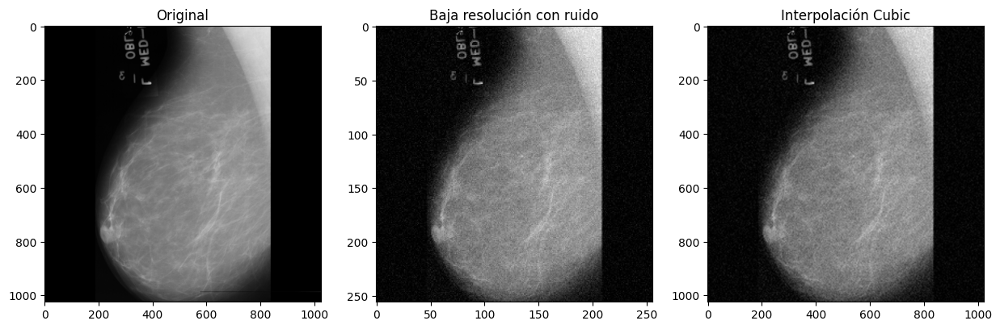

Imagen 1 - PSNR: 29.37, SSIM: 0.5112


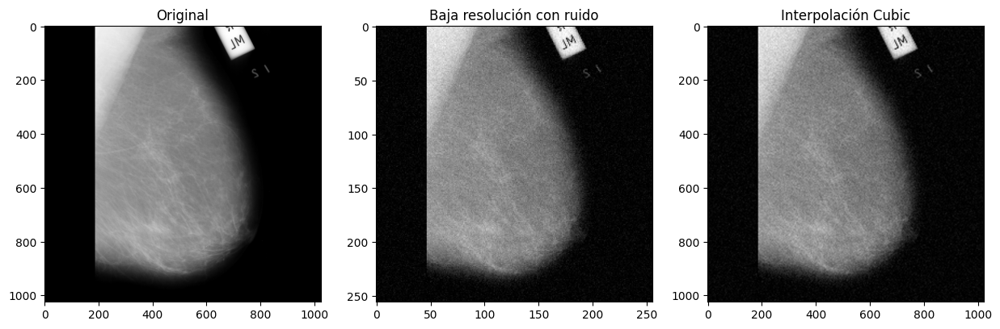

Imagen 2 - PSNR: 30.28, SSIM: 0.4683


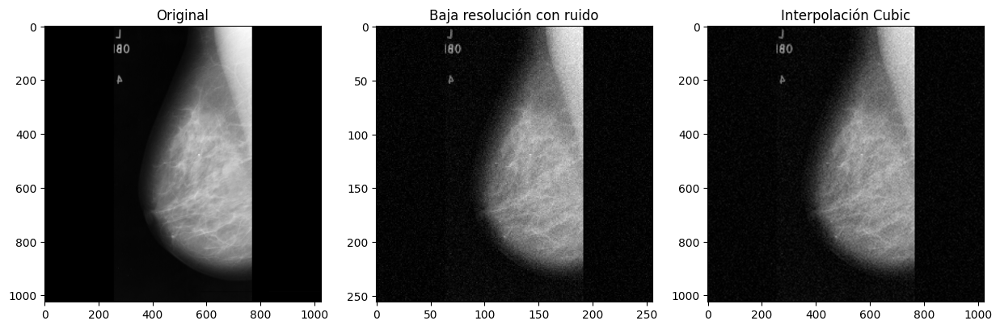

Imagen 3 - PSNR: 29.76, SSIM: 0.4703


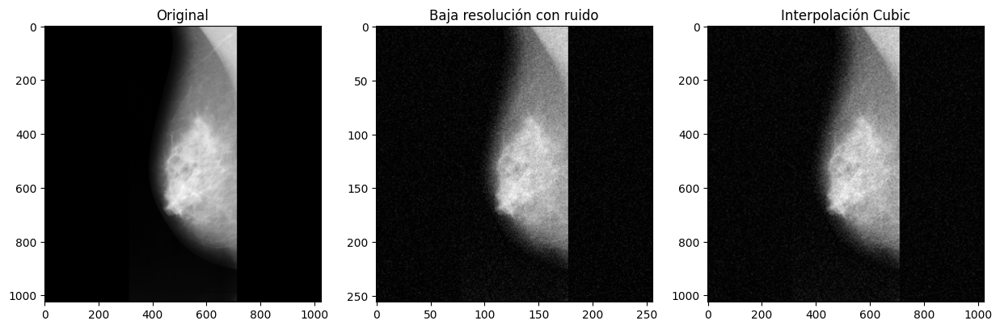

Imagen 4 - PSNR: 30.18, SSIM: 0.3939


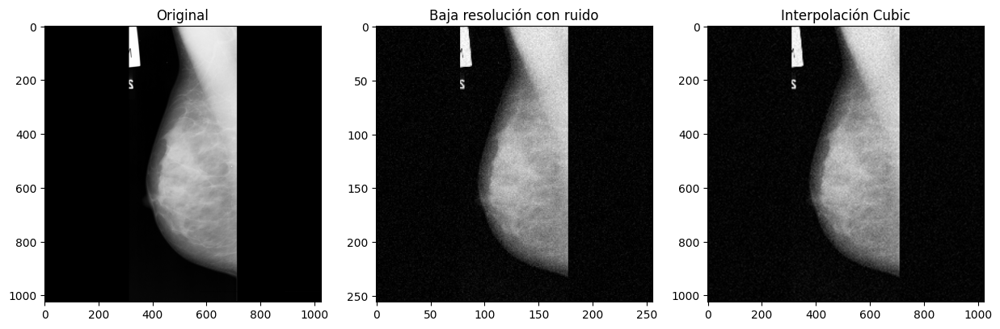

Imagen 5 - PSNR: 29.31, SSIM: 0.4027
PSNR promedio Cubic: 29.78, SSIM promedio Cubic: 0.4493

Evaluando método de interpolación: Lanczos4


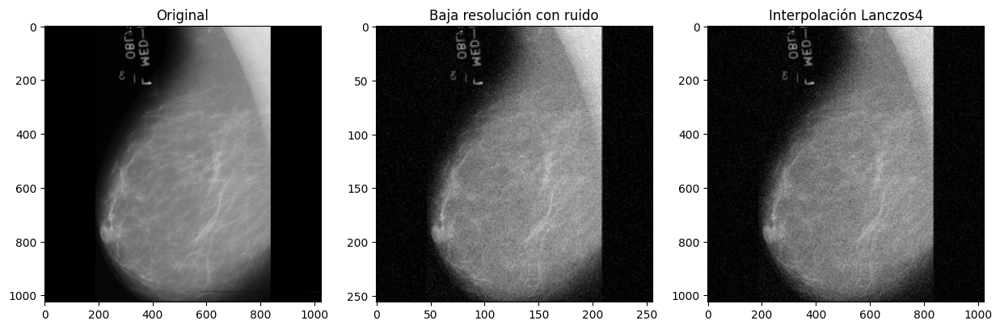

Imagen 1 - PSNR: 29.09, SSIM: 0.4851


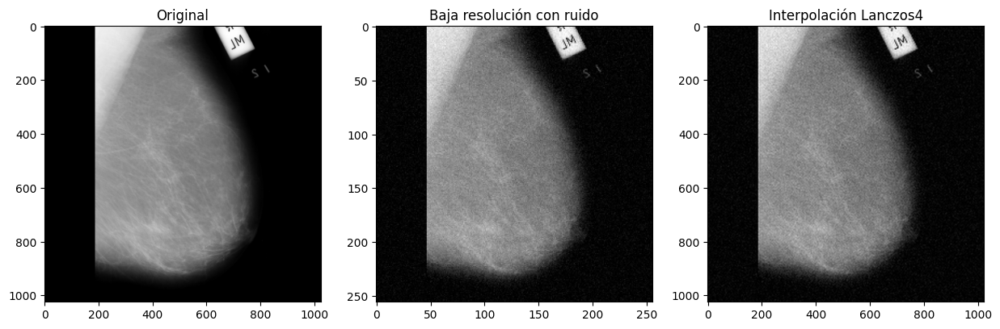

Imagen 2 - PSNR: 29.89, SSIM: 0.4418


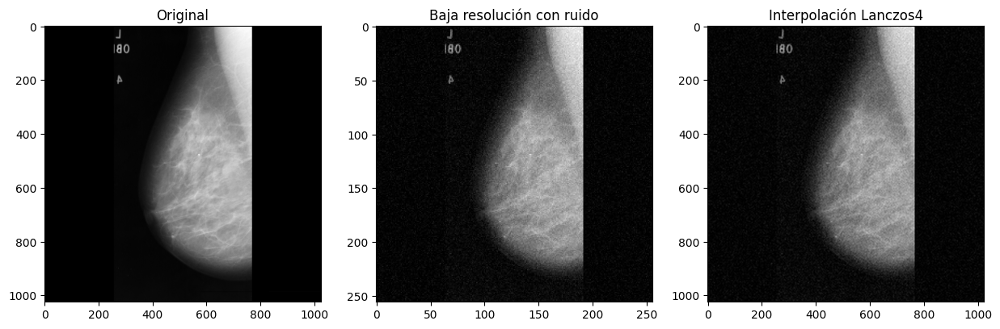

Imagen 3 - PSNR: 29.48, SSIM: 0.4468


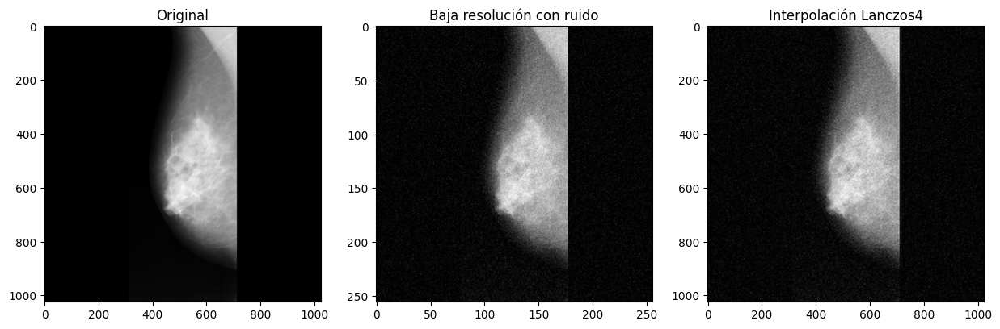

Imagen 4 - PSNR: 29.89, SSIM: 0.3722


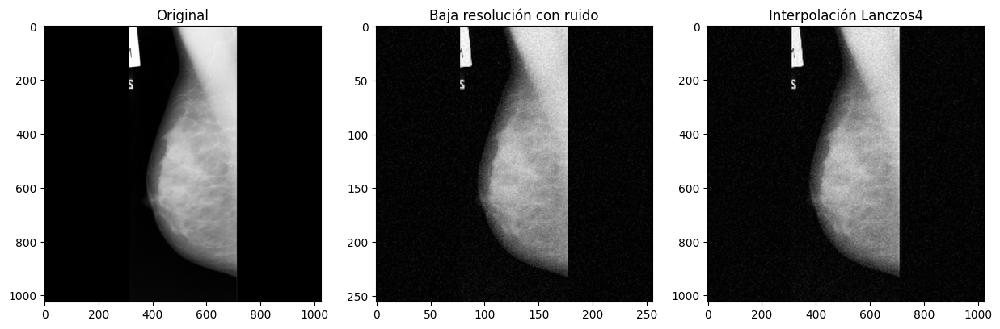

Imagen 5 - PSNR: 29.06, SSIM: 0.3798
PSNR promedio Lanczos4: 29.48, SSIM promedio Lanczos4: 0.4251



In [9]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from skimage.metrics import structural_similarity as compare_ssim

# Directorio de imágenes
data_dir = "mias/all-mias/"

# Cargar imágenes
images = []
for file_name in os.listdir(data_dir):
    if file_name.endswith('.pgm'):
        img_path = os.path.join(data_dir, file_name)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        images.append(img)

# Normalización y preparación
images = np.array(images)
images = images.astype('float32') / 255.0

# Convertir imágenes en escala de grises a imágenes RGB
val_images = images[:10]
val_images_rgb = [np.stack((img,)*3, axis=-1) for img in val_images]

# Realizar la bajada de resolución
val_images_resized = [cv2.resize(img, (img.shape[1]//4, img.shape[0]//4)) for img in val_images_rgb]

# Añadir ruido gaussiano a las imágenes de baja resolución
noise_std = 0.05
val_images_noisy = [img + noise_std * np.random.randn(*img.shape) for img in val_images_resized]
val_images_noisy = np.clip(val_images_noisy, 0, 1)  # Asegurarse de que los valores estén en el rango [0, 1]

# Convertir imágenes a uint8 para OpenCV
val_images_noisy_uint8 = [np.uint8(img * 255) for img in val_images_noisy]

# Métodos de interpolación en OpenCV
interpolation_methods = {
    "Nearest": cv2.INTER_NEAREST,
    "Linear": cv2.INTER_LINEAR,
    "Cubic": cv2.INTER_CUBIC,
    "Lanczos4": cv2.INTER_LANCZOS4
}

# Realizar la interpolación y la comparación
for method_name, method in interpolation_methods.items():
    print(f"Evaluando método de interpolación: {method_name}")

    psnr_values = []
    ssim_values = []

    interpolated_images = [cv2.resize(img, (img.shape[1]*4, img.shape[0]*4), interpolation=method) for img in val_images_noisy_uint8]

    for i in range(5):
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 3, 1)
        plt.title('Original')
        plt.imshow(val_images[i], cmap='gray')

        plt.subplot(1, 3, 2)
        plt.title('Baja resolución con ruido')
        plt.imshow(cv2.cvtColor(val_images_noisy_uint8[i], cv2.COLOR_BGR2GRAY), cmap='gray')

        plt.subplot(1, 3, 3)
        plt.title(f'Interpolación {method_name}')
        plt.imshow(cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY), cmap='gray')
        plt.show()

        # Calcular PSNR y SSIM
        original_img = (val_images[i] * 255).astype(np.uint8)
        interpolated_img_gray = cv2.cvtColor(interpolated_images[i], cv2.COLOR_BGR2GRAY)

        psnr_value = compare_psnr(original_img, interpolated_img_gray)
        ssim_value = compare_ssim(original_img, interpolated_img_gray)

        psnr_values.append(psnr_value)
        ssim_values.append(ssim_value)

        print(f'Imagen {i+1} - PSNR: {psnr_value:.2f}, SSIM: {ssim_value:.4f}')

    # Mostrar los valores promedio de PSNR y SSIM
    average_psnr = np.mean(psnr_values)
    average_ssim = np.mean(ssim_values)
    print(f'PSNR promedio {method_name}: {average_psnr:.2f}, SSIM promedio {method_name}: {average_ssim:.4f}\n')